<a href="https://colab.research.google.com/github/kfahn22/computer-vision-course/blob/synthetic-data-creation-lung-images/Synthetic_lung_images_hf_course.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Menggunakan DCGAN untuk Menghasilkan Gambar Paru-paru Sintetis

* DCGAN diperkenalkan dalam makalah [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/abs/1511.06434) oleh Radford, dkk.

Dalam notebook ini kita akan:

* Mengunduh gambar X-ray paru-paru dari Hugging Face Hub
* Memproses gambar
* Menggunakan DCGAN untuk menghasilkan gambar sintetis
* Memvisualisasikan proses pelatihan

* Notebook demo ini diadaptasi dari [sini](https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/image-generation/miniconda/dcgan-image-generation/notebook_chest_image_generation_dcgan.ipynb) dan [sini](https://github.com/huggingface/community-events/tree/main/huggan/pytorch/dcgan). Notebook ini dijalankan selama beberapa jam menggunakan High-RAM.

### Tentang Dataset

#### Ringkasan yang diambil dari [Identifying Medical Diagnoses and Treatable Diseases by Image-Based Deep Learning](https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867418301545%3Fshowall%3Dtrue):

* Dataset ini disusun dalam 3 folder (train, test, val) dan berisi subfolder untuk setiap kategori gambar (Pneumonia/Normal). Terdapat 5.863 gambar X-ray (JPEG) dan 2 kategori (Pneumonia/Normal).

* Gambar X-ray dada (anterior-posterior) dipilih dari kohor retrospektif pasien anak-anak berusia satu hingga lima tahun dari Guangzhou Women and Children’s Medical Center, Guangzhou. Semua pencitraan X-ray dada dilakukan sebagai bagian dari perawatan klinis rutin pasien.

* Untuk analisis gambar X-ray dada, semua radiografi dada awalnya disaring untuk kontrol kualitas dengan menghapus semua hasil scan yang berkualitas rendah atau tidak terbaca. Diagnosa untuk gambar tersebut kemudian dinilai oleh dua dokter ahli sebelum disetujui untuk melatih sistem AI. Untuk mengantisipasi kesalahan penilaian, set evaluasi juga diperiksa oleh seorang ahli ketiga.

[Sumber Dataset](https://data.mendeley.com/datasets/rscbjbr9sj/2)

### Pertama, kita akan menginstal dependensinya

In [ ]:
!pip install -q datasets huggingface_hub datasets torch torchvision accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.1 MB/s eta 0:00:00


### Selanjutnya, kita akan mengunduh dataset dari Hugging Face Hub.

In [ ]:
from datasets import load_dataset  # Mengimpor fungsi load_dataset dari pustaka 'datasets'

# Memuat dataset gambar dada yang digunakan untuk mendeteksi pneumonia pada X-ray
dataset = load_dataset("hf-vision/chest-xray-pneumonia")  # Memuat dataset 'chest-xray-pneumonia' dari Hugging Face


### Sebelum menjalankan model, ada baiknya untuk sedikit menjelajahi kumpulan data.

Kita akan mulai dengan mencari panjang kumpulan data.

In [ ]:
len(dataset['train'])

5216

Mari kita visualisasikan 4 gambar pertama dari kumpulan data, yang diberi label "normal".

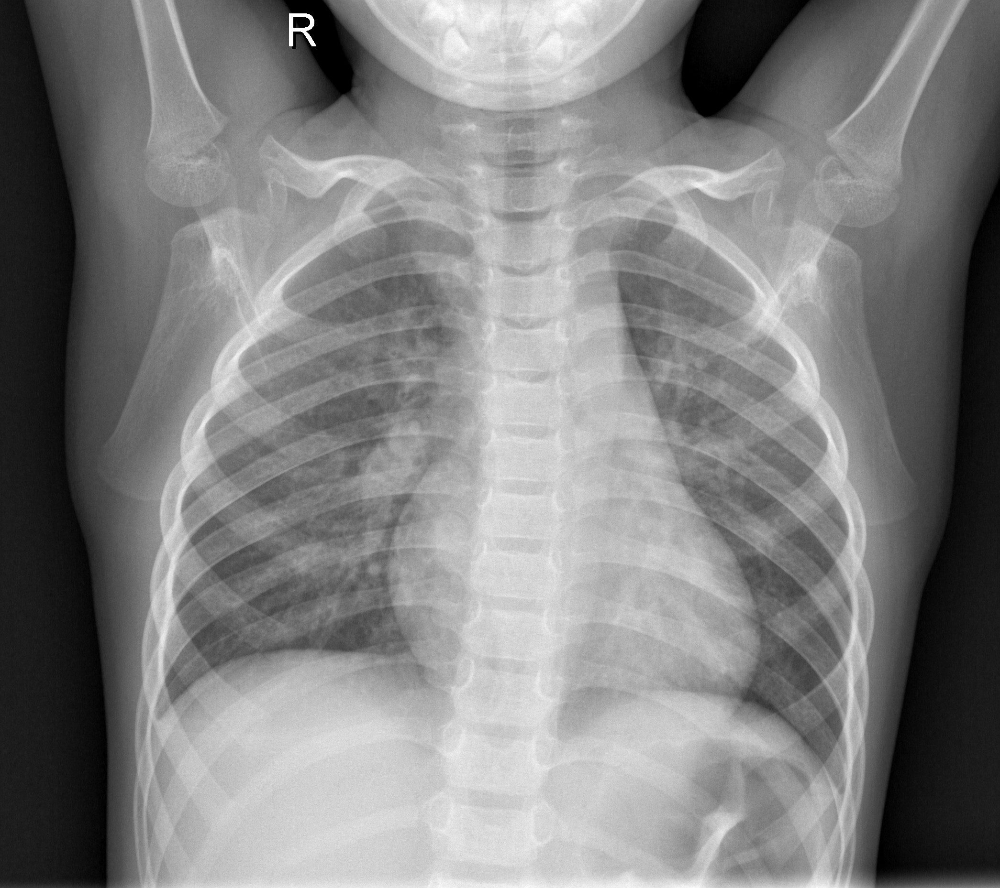

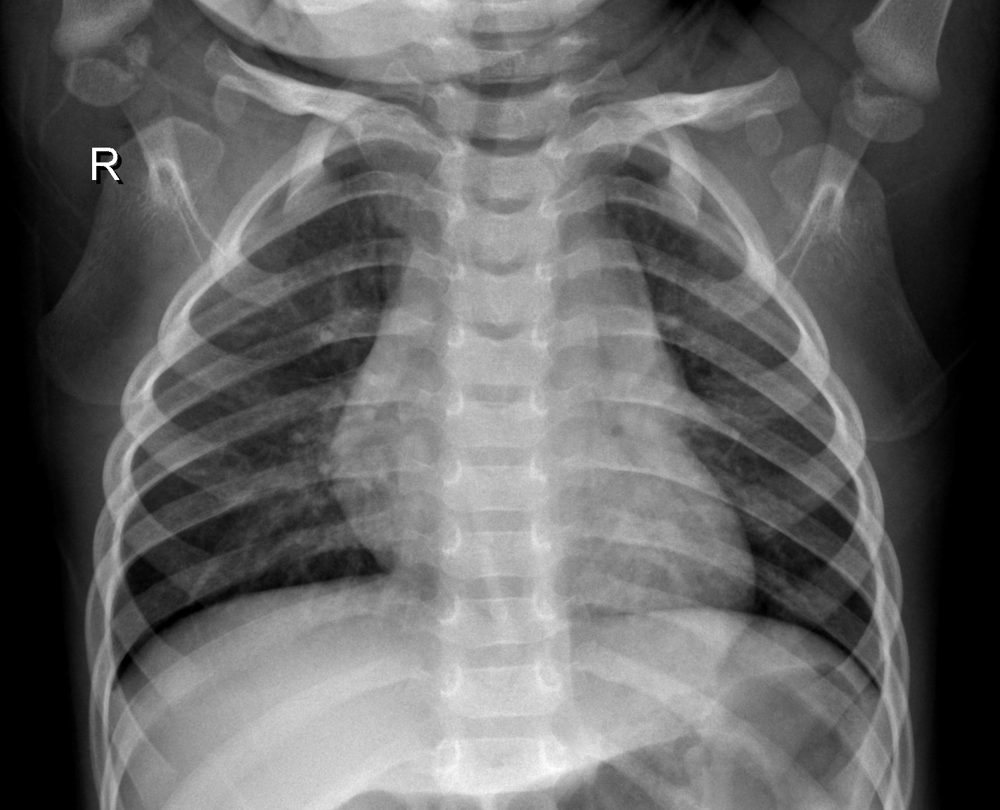

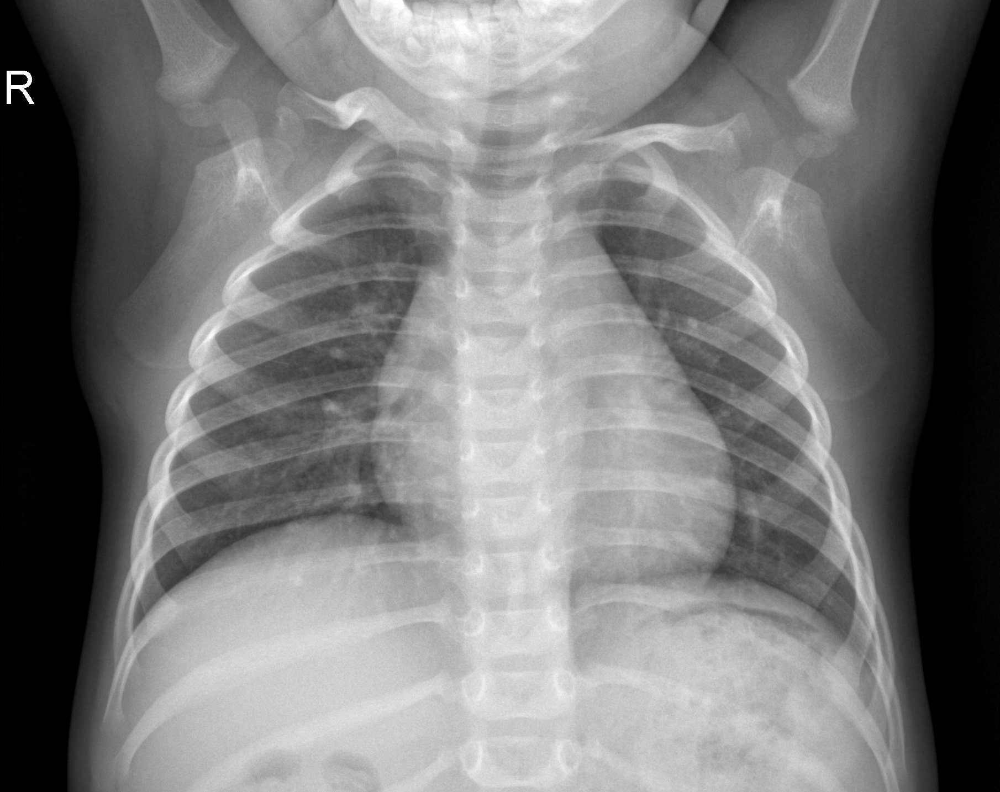

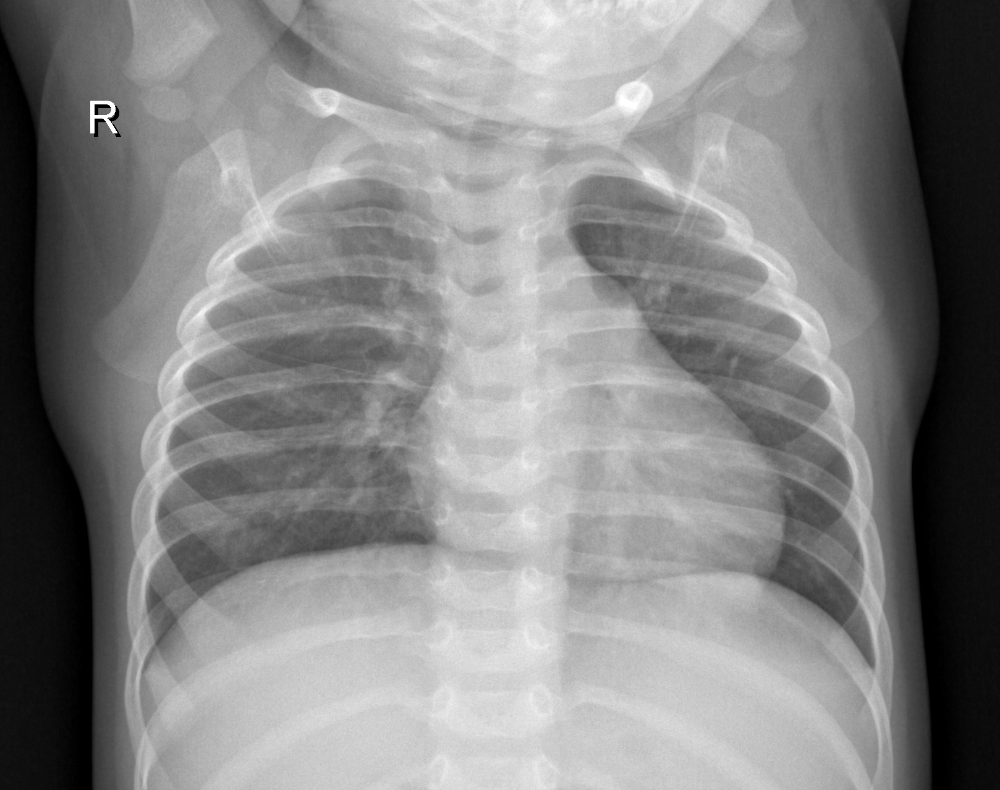

In [ ]:
from PIL import Image  # Mengimpor modul Image dari pustaka PIL untuk membuka dan memanipulasi gambar
from IPython.display import display  # Mengimpor fungsi display untuk menampilkan gambar di notebook

# Menampilkan gambar pertama pada dataset pelatihan (train)
for i in range(4):  # Loop untuk menampilkan 4 gambar pertama dalam dataset pelatihan
     display(dataset["train"][i]['image'])  # Mengambil gambar ke-i dari split "train" dan menampilkannya


Sekarang mari kita lihat 4 gambar terakhir dalam kumpulan data, yang diberi label "pneumonia."

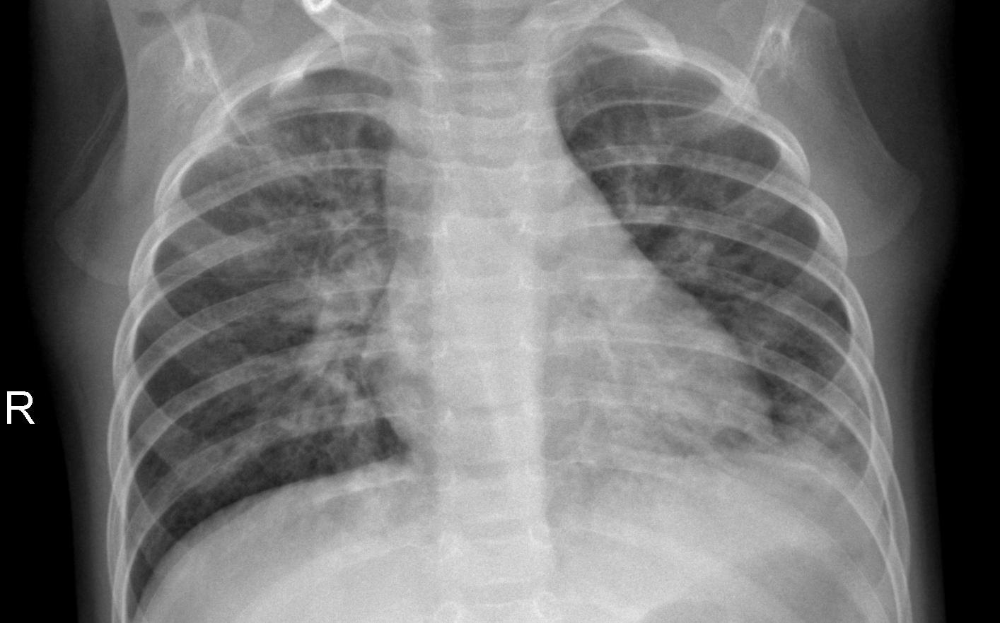

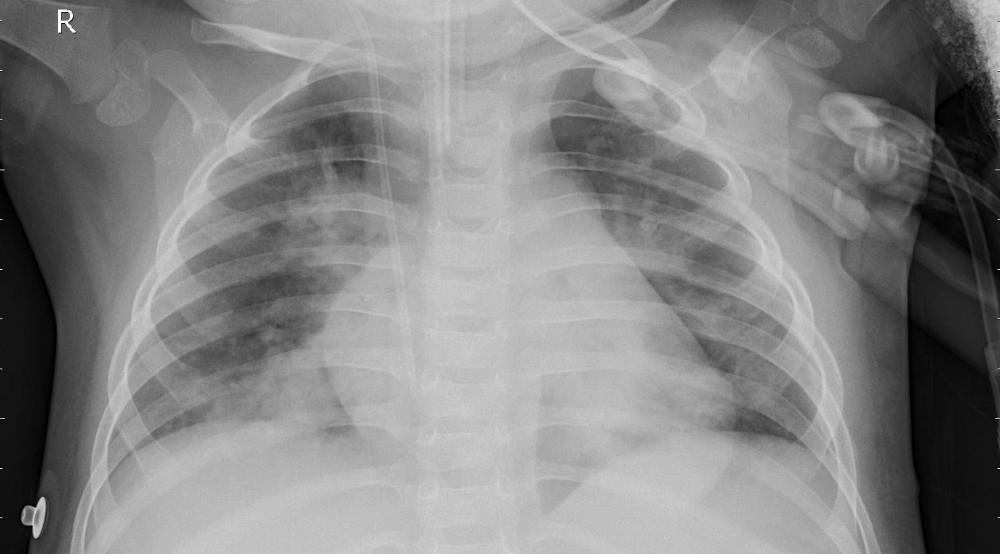

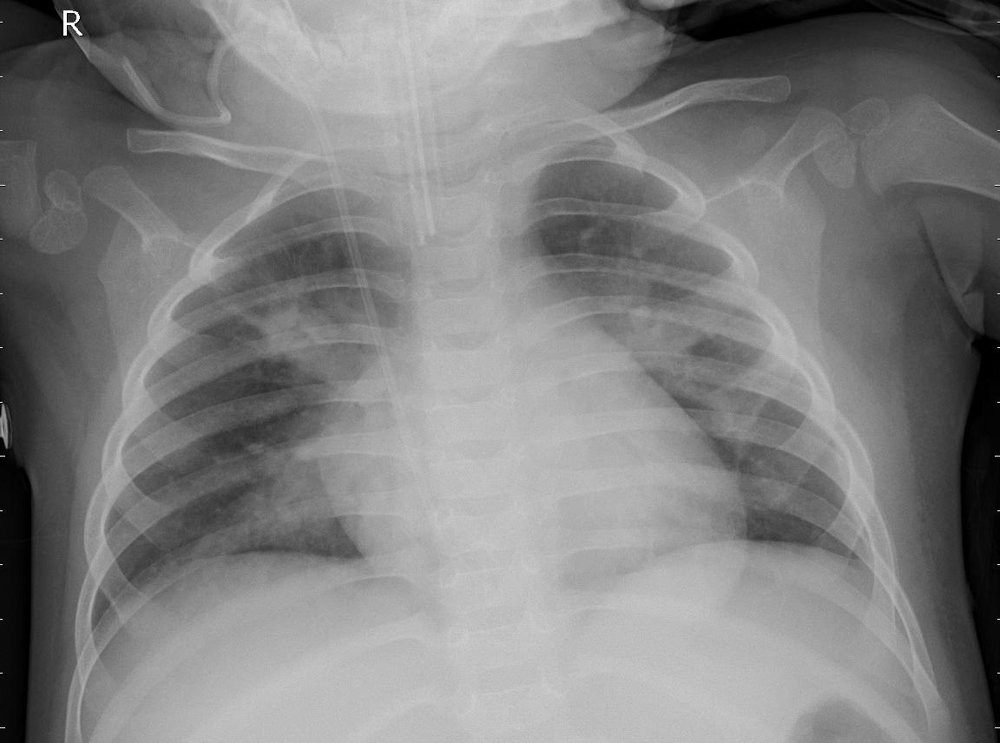

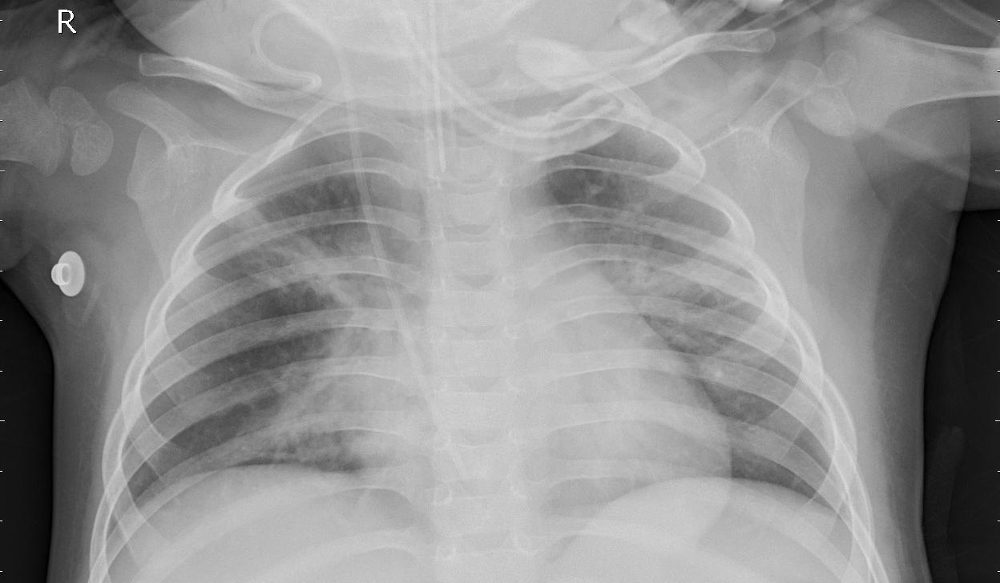

In [ ]:
from PIL import Image  # Mengimpor modul Image dari pustaka PIL untuk membuka dan memanipulasi gambar
from IPython.display import display  # Mengimpor fungsi display untuk menampilkan gambar dalam notebook Jupyter

# Menampilkan gambar dari indeks 5211 hingga 5214 pada dataset pelatihan (train)
for i in range(5211, 5215):  # Loop untuk menampilkan gambar dengan indeks 5211 hingga 5214
     display(dataset["train"][i]['image'])  # Mengambil gambar ke-i dari split "train" dan menampilkannya


### Kami akan mengimpor pustaka yang diperlukan

In [ ]:
from IPython.display import HTML  # Untuk menampilkan HTML dalam notebook Jupyter
import matplotlib.animation as animation  # Digunakan untuk membuat animasi dengan matplotlib
import matplotlib.pyplot as plt  # Pustaka untuk visualisasi data (grafik) di Python
import math  # Modul matematika untuk fungsi matematika dasar
import numpy as np  # Pustaka untuk operasi array dan komputasi numerik (termasuk aljabar linier)
import os  # Modul untuk berinteraksi dengan sistem file dan direktori
import random  # Modul untuk operasi acak (misalnya, memilih elemen acak)
import torch  # Pustaka utama untuk operasi tensor dan komputasi di PyTorch
import torch.nn as nn  # Modul untuk mendefinisikan model jaringan saraf (neural network) di PyTorch
import torch.optim as optim  # Modul untuk optimasi dalam pelatihan jaringan saraf

from PIL import Image  # Pustaka untuk manipulasi gambar, digunakan untuk membuka dan menyimpan gambar
import torchvision.transforms as transforms  # Modul untuk menerapkan transformasi gambar dalam dataset
from torchvision.transforms import CenterCrop, Compose, Normalize, Resize, ToTensor  # Fungsi transformasi untuk pra-pemrosesan gambar
import torchvision.utils as vutils  # Pustaka utilitas untuk bekerja dengan gambar dalam batch
from torch.utils.data import DataLoader  # Modul untuk memuat data dalam batch selama pelatihan

### Sekarang kita akan melakukan praproses data

* Kita akan menstandardisasi gambar menggunakan Resize dan CenterCrop.

* Kita akan mengubah gambar menjadi tensor.

* Kita akan menormalkan data:

* Rata-rata (0,5, 0,5, 0,5) memastikan bahwa data gambar kira-kira berpusat di sekitar nol. Ini dapat membantu mencegah masalah yang terkait dengan gradien yang menghilang atau meledak selama pelatihan.

* Deviasi standar ke (0,5, 0,5, 0,5), Anda menskalakan data input agar berada dalam rentang [-1, 1]. Rentang ini sering kali lebih disukai untuk jaringan generator di GAN

In [ ]:
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
import torchvision.transforms as transforms
from torchvision.transforms import CenterCrop, Compose, Normalize, Resize, ToTensor
import torchvision.utils as vutils
from torch.utils.data import DataLoader
from datasets import load_dataset

# Menentukan parameter dan pengaturan awal
batch_size = 128  # Ukuran batch untuk pelatihan
nb_gpu = 1  # Jumlah GPU yang tersedia
nb_workers = 2  # Jumlah pekerja untuk memuat data (sesuaikan dengan sumber daya sistem)

# Tentukan perangkat yang akan digunakan (GPU atau CPU)
device = torch.device("cuda:0" if (torch.cuda.is_available() and nb_gpu > 0) else "cpu")

# Parameter input dan ukuran gambar
n_channels = 3  # Jumlah saluran gambar (RGB)
image_size = 64  # Ukuran gambar yang akan digunakan
input_shape = (image_size, image_size)  # Bentuk input gambar

# Setel seed untuk reproduksibilitas
seed = 22
random.seed(seed)  # Setel seed untuk random library
torch.manual_seed(seed)  # Setel seed untuk PyTorch
torch.backends.cudnn.deterministic = True  # Memastikan hasil yang deterministik pada GPU
torch.backends.cudnn.benchmark = False  # Menonaktifkan pencarian algoritma yang lebih cepat (untuk konsistensi)

# Definisikan transformasi gambar yang akan diterapkan
transform = Compose(
    [
        Resize(image_size),  # Mengubah ukuran gambar menjadi 64x64
        CenterCrop(image_size),  # Memotong gambar di bagian tengah
        ToTensor(),  # Mengonversi gambar menjadi tensor PyTorch
        Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Menormalkan gambar untuk setiap saluran
    ]
)

# Fungsi untuk menerapkan transformasi pada dataset
def transforms(examples):
    examples["image"] = [transform(image.convert("RGB")) for image in examples["image"]]
    return examples

# Memuat dataset dan menerapkan transformasi
dataset = load_dataset("hf-vision/chest-xray-pneumonia")  # Menggunakan dataset X-ray pneumonia
transformed_dataset = dataset.with_transform(transforms)

# Membuat DataLoader untuk batch data selama pelatihan
dataloader = DataLoader(
    transformed_dataset["train"], batch_size=batch_size, shuffle=True, num_workers=nb_workers
)

# Mengambil satu batch data dari DataLoader
real_batch = next(iter(dataloader))

# Menampilkan gambar pertama dalam batch yang diambil
plt.imshow(real_batch["image"][0].permute(1, 2, 0))  # Mengonversi tensor ke format yang bisa ditampilkan
plt.axis("off")  # Menonaktifkan axis untuk visualisasi gambar
plt.show()

# Informasi perangkat dan dimensi batch
print(f"Device: {device}")
print(f"Input shape: {input_shape}")
print(f"Batch size: {batch_size}")
print(f"Number of GPU(s) available: {nb_gpu}")


## Sekarang kita akan membuat model

Pertama, kita tentukan beberapa parameter.

In [ ]:
# Ukuran vektor laten z (yaitu ukuran input generator), sama seperti yang dijelaskan dalam makalah DCGAN
nz = 100  # Ukuran vektor input (ruang laten) untuk generator. Ini biasanya adalah vektor berdimensi 100 yang diambil dari distribusi normal yang digunakan sebagai input untuk generator.

# Ukuran peta fitur pada generator
ngf = 64  # Jumlah filter (peta fitur) di lapisan pertama generator. Meningkatkan angka ini meningkatkan kompleksitas jaringan generator.

# Ukuran peta fitur pada diskriminator
ndf = 64  # Jumlah filter (peta fitur) di lapisan pertama diskriminator. Nilai yang lebih tinggi meningkatkan kapasitas diskriminator.

# Jumlah epoch pelatihan
num_epochs = 100  # Jumlah kali dataset lengkap akan digunakan selama pelatihan. Lebih banyak epoch dapat menghasilkan kinerja model yang lebih baik, tetapi juga dapat menyebabkan overfitting.

# Tingkat pembelajaran untuk optimizer, nilai yang sama seperti yang dijelaskan dalam makalah DCGAN
lr = 0.0002  # Tingkat pembelajaran mengontrol seberapa besar langkah yang diambil oleh optimizer selama pelatihan. Nilai yang lebih kecil dapat memperlambat pelatihan, tetapi dapat membantu menghindari langkah yang terlalu besar.

# Hyperparameter Beta1 untuk optimizer Adam, nilai yang sama seperti yang dijelaskan dalam makalah DCGAN
beta1 = 0.5  # Ini adalah istilah momentum pertama dalam optimizer Adam. Biasanya diatur ke 0.5 untuk GAN, karena telah terbukti membantu meningkatkan stabilitas pelatihan.

Bobot model diinisialisasi secara acak dari distribusi Normal dengan mean=0, stdev=0,02.
Bobot ini diterapkan pada setiap lapisan Generator dan Diskriminator.

In [ ]:
def weights_init(m):
    # Mendapatkan nama kelas dari objek 'm'
    classname = m.__class__.__name__

    # Jika kelasnya mengandung 'Conv' (menandakan layer konvolusi)
    if classname.find('Conv') != -1:
        # Inisialisasi bobot dengan distribusi normal, rata-rata 0.0 dan deviasi standar 0.02
        nn.init.normal_(m.weight.data, 0.0, 0.02)

    # Jika kelasnya mengandung 'BatchNorm' (menandakan lapisan normalisasi batch)
    elif classname.find('BatchNorm') != -1:
        # Inisialisasi bobot dengan distribusi normal, rata-rata 1.0 dan deviasi standar 0.02
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        # Set bias menjadi 0
        nn.init.constant_(m.bias.data, 0)

### Tentukan Generator

In [ ]:
# Kode Generator
class Generator(nn.Module):
    def __init__(self, nb_gpu):
        super(Generator, self).__init__()
        self.nb_gpu = nb_gpu

        # Menyusun layer-layer utama dari Generator menggunakan Sequential
        self.main = nn.Sequential(
            # input adalah Z (latent vector), masuk ke dalam layer konvolusi terbalik pertama (ConvTranspose2d)

            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),  # Layer pertama: z menjadi 4x4 feature map
            nn.BatchNorm2d(ngf * 8),  # Batch Normalization
            nn.ReLU(True),  # Aktivasi ReLU

            # state size: (ngf*8) x 4 x 4

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),  # Layer kedua: mengubah ukuran menjadi 8x8
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            # state size: (ngf*4) x 8 x 8

            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),  # Layer ketiga: mengubah ukuran menjadi 16x16
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            # state size: (ngf*2) x 16 x 16

            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),  # Layer keempat: mengubah ukuran menjadi 32x32
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            # state size: (ngf) x 32 x 32

            nn.ConvTranspose2d(ngf, n_channels, 4, 2, 1, bias=False),  # Layer kelima: menghasilkan gambar akhir 64x64
            nn.Tanh()  # Fungsi aktivasi Tanh untuk menghasilkan nilai antara -1 dan 1

            # state size: (n_channels) x 64 x 64
        )

    # Fungsi forward untuk menghitung keluaran dari Generator
    def forward(self, input):
        return self.main(input)


### Buat Generator

In [ ]:
# Membuat instance dari Generator
gen_net = Generator(nb_gpu).to(device)

# Menangani multi-GPU jika diperlukan
if (device.type == 'cuda') and (nb_gpu > 1):
    gen_net = nn.DataParallel(gen_net, list(range(nb_gpu)))

# Menerapkan fungsi ``weights_init`` untuk menginisialisasi bobot secara acak
gen_net.apply(weights_init)

# Mencetak model
print(gen_net)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Definisikan Diskriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, nb_gpu):
        super(Discriminator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input adalah ``(nb_channels) x 64 x 64``, dimensi input yang diterima oleh discriminator

            # Layer konvolusi pertama dengan 1 saluran input, mengubahnya menjadi feature map dengan 'ndf' saluran.
            nn.Conv2d(n_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),  # Fungsi aktivasi LeakyReLU dengan alpha 0.2
            # ukuran state setelah layer ini menjadi ``(ndf) x 32 x 32``

            # Layer konvolusi kedua, menambah jumlah saluran feature map menjadi 'ndf*2'
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),  # Batch Normalization untuk stabilisasi pelatihan
            nn.LeakyReLU(0.2, inplace=True),  # Fungsi aktivasi LeakyReLU
            # ukuran state setelah layer ini menjadi ``(ndf*2) x 16 x 16``

            # Layer konvolusi ketiga, meningkatkan jumlah saluran menjadi 'ndf*4'
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),  # Batch Normalization untuk stabilisasi pelatihan
            nn.LeakyReLU(0.2, inplace=True),  # Fungsi aktivasi LeakyReLU
            # ukuran state setelah layer ini menjadi ``(ndf*4) x 8 x 8``

            # Layer konvolusi keempat, meningkatkan jumlah saluran menjadi 'ndf*8'
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),  # Batch Normalization untuk stabilisasi pelatihan
            nn.LeakyReLU(0.2, inplace=True),  # Fungsi aktivasi LeakyReLU
            # ukuran state setelah layer ini menjadi ``(ndf*8) x 4 x 4``

            # Layer konvolusi terakhir yang menghasilkan output 1 saluran (nilai 0 atau 1)
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()  # Fungsi aktivasi Sigmoid untuk menghasilkan nilai probabilitas antara 0 dan 1
        )

    def forward(self, input):
        return self.main(input)  # Mengarahkan input melalui semua layer yang telah didefinisikan


### Ciptakan Diskriminator

In [ ]:
# Membuat model Discriminator
disc_net = Discriminator(nb_gpu).to(device)

# Menangani multi-GPU jika diinginkan
if (device.type == 'cuda') and (nb_gpu > 1):
    # Jika menggunakan lebih dari satu GPU, model akan dibagi untuk dijalankan di beberapa GPU
    disc_net = nn.DataParallel(disc_net, list(range(nb_gpu)))

# Menerapkan fungsi ``weights_init`` untuk menginisialisasi bobot secara acak
# Fungsi ini akan menginisialisasi bobot dengan distribusi normal (mean=0, stdev=0.2)
disc_net.apply(weights_init)

# Mencetak arsitektur model
print(disc_net)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Ada dua jenis kesalahan statistik:
* Jenis 1 - Positif Palsu
* Jenis 2 - Negatif Palsu

Dalam kasus kita, diskriminator dapat membuat dua jenis kesalahan. Pertama, diskriminator dapat memberi label gambar asli sebagai "palsu". Kedua, diskriminator dapat memberi label gambar palsu sebagai "asli".

In [ ]:
# Gambar asli dan discriminator berpikir itu asli - Keputusan yang benar
target = 1
output = 0.99

# Menghitung loss untuk keputusan yang benar (genuine image dan output mendekati 1)
# Ini adalah fungsi binary cross entropy
print(-(target * math.log(output) + (1 - target) * math.log(1 - output)))

# Gambar asli dan discriminator berpikir itu palsu - Keputusan yang salah
target = 1
output = 0.01

# Menghitung loss untuk keputusan yang salah (genuine image dan output mendekati 0)
# Output yang mendekati 0 berarti discriminator berpikir itu palsu, tetapi targetnya adalah 1 (genuine image)
print(-(target * math.log(output) + (1 - target) * math.log(1 - output)))

# Gambar palsu tetapi discriminator berpikir itu asli - Keputusan yang salah
target = 0
output = 0.99

# Menghitung loss untuk keputusan yang salah (fake image dan output mendekati 1)
# Output yang mendekati 1 berarti discriminator berpikir gambar itu asli, tetapi targetnya adalah 0 (fake image)
print(-(target * math.log(output) + (1 - target) * math.log(1 - output)))


0.01005033585350145
4.605170185988091
4.605170185988091


### Kami akan menggunakan Binary Cross Entropy Loss sebagai fungsi kerugian kami.

* BCELoss mengukur perbedaan antara probabilitas yang diprediksi dan nilai target aktual.

In [ ]:
# Set real and fake label values (following GAN paper convention)
real_label = 1.  # Label untuk gambar yang asli
fake_label = 0.  # Label untuk gambar yang palsu

# Define loss function
criterion = nn.BCELoss()  # Fungsi loss Binary Cross-Entropy

### Kami menyiapkan pengoptimal menggunakan parameter yang disediakan oleh makalah DCGAN

In [ ]:
optimizerD = optim.Adam(disc_net.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(gen_net.parameters(), lr=lr, betas=(beta1, 0.999))

## Pelatihan

### Kami melakukan inisialisasi dengan gangguan acak.

In [ ]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

### Kami akan menyimpan titik pemeriksaan model ke beberapa folder. Anda juga dapat mengunggah model ke Hugging Face Hub.

In [ ]:
# Flags - Untuk setiap epoch
show_images = True  # Menandakan apakah gambar yang dihasilkan akan ditampilkan setelah setiap epoch
save_images = True  # Menandakan apakah gambar yang dihasilkan akan disimpan setelah setiap epoch
save_model = True  # Menandakan apakah model Generator dan Discriminator akan disimpan setelah setiap epoch

# Fungsi untuk menyimpan model DCGAN
def save_dcgan(netG, netD, path_checkpoint):
    checkpoint = {"g_model_state_dict": gen_net.state_dict(),  # Menyimpan bobot model Generator
                  "d_model_state_dict": disc_net.state_dict(),  # Menyimpan bobot model Discriminator
                 }

    torch.save(checkpoint, path_checkpoint)  # Menyimpan checkpoint ke file dengan path yang ditentukan

# Fungsi untuk membuat direktori baru jika belum ada
def makedir(new_dir):
  if not os.path.exists(new_dir):  # Memeriksa apakah direktori sudah ada
    os.makedirs(new_dir)  # Jika tidak ada, buat direktori baru

# Membuat folder untuk menyimpan gambar dan model yang dilatih
makedir("images")  # Membuat folder 'images' untuk menyimpan gambar yang dihasilkan
makedir("models")  # Membuat folder 'models' untuk menyimpan model yang telah dilatih


### Mari buat training loop

**Untuk setiap epoch:**

* **Perbarui Discriminator:**
  * Bersihkan gradien dari discriminator
  * Ambil batch gambar nyata dari dataset
  * Buat tensor untuk label nyata
  * Lewatkan gambar nyata melalui discriminator dan ambil output
  * Hitung loss discriminator untuk data nyata
  * Lakukan backpropagation untuk gradien

* **Perbarui Generator:**
  * Bersihkan gradien dari generator
  * Isi tensor label dengan label nyata (berusaha untuk menipu discriminator)
  * Lewatkan data palsu yang dihasilkan melalui discriminator
  * Hitung loss generator berdasarkan respons discriminator
  * Lakukan backpropagation untuk gradien

* Perbarui parameter Generator dan Discriminator berdasarkan gradien

* Cetak statistik pelatihan

* Simpan loss untuk pemetaan

* Simpan model

Epoch: 0/100 Batches: 0/41	Loss_D: 1.7490   Loss_G: 5.9989    D(x): 0.7465    D(G(z)): 0.7043 / 0.0043


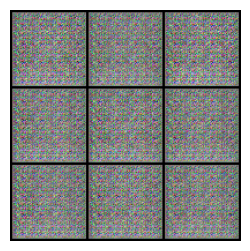

Epoch: 1/100 Batches: 0/41	Loss_D: 0.0243   Loss_G: 24.2771    D(x): 0.9881    D(G(z)): 0.0000 / 0.0000
Epoch: 2/100 Batches: 0/41	Loss_D: 0.4267   Loss_G: 8.7650    D(x): 0.8978    D(G(z)): 0.1689 / 0.0005
Epoch: 3/100 Batches: 0/41	Loss_D: 0.4963   Loss_G: 5.8759    D(x): 0.7268    D(G(z)): 0.0264 / 0.0043
Epoch: 4/100 Batches: 0/41	Loss_D: 0.6237   Loss_G: 7.0209    D(x): 0.8969    D(G(z)): 0.3507 / 0.0027
Epoch: 5/100 Batches: 0/41	Loss_D: 0.4415   Loss_G: 5.2512    D(x): 0.9424    D(G(z)): 0.2803 / 0.0096
Epoch: 6/100 Batches: 0/41	Loss_D: 0.6055   Loss_G: 4.2842    D(x): 0.8455    D(G(z)): 0.2987 / 0.0326
Epoch: 7/100 Batches: 0/41	Loss_D: 0.6063   Loss_G: 3.2278    D(x): 0.7392    D(G(z)): 0.2032 / 0.0757
Epoch: 8/100 Batches: 0/41	Loss_D: 1.0650   Loss_G: 4.8959    D(x): 0.4922    D(G(z)): 0.0195 / 0.0198
Epoch: 9/100 Batches: 0/41	Loss_D: 1.0724   Loss_G: 3.2590    D(x): 0.4525    D(G(z)): 0.0167 / 0.1196
Epoch: 10/100 Batches: 0/41	Loss_D: 0.3465   Loss_G: 4.8959    D(x): 0.8

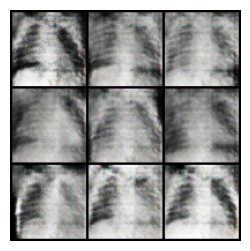

Epoch: 11/100 Batches: 0/41	Loss_D: 0.3994   Loss_G: 3.8819    D(x): 0.7852    D(G(z)): 0.0996 / 0.0461
Epoch: 12/100 Batches: 0/41	Loss_D: 0.5003   Loss_G: 6.1120    D(x): 0.8837    D(G(z)): 0.2773 / 0.0095
Epoch: 13/100 Batches: 0/41	Loss_D: 0.9394   Loss_G: 8.8413    D(x): 0.9589    D(G(z)): 0.5382 / 0.0035
Epoch: 14/100 Batches: 0/41	Loss_D: 0.5378   Loss_G: 5.6782    D(x): 0.9091    D(G(z)): 0.3216 / 0.0141
Epoch: 15/100 Batches: 0/41	Loss_D: 1.1694   Loss_G: 1.9285    D(x): 0.4388    D(G(z)): 0.0275 / 0.1963
Epoch: 16/100 Batches: 0/41	Loss_D: 0.3184   Loss_G: 3.8789    D(x): 0.9070    D(G(z)): 0.1698 / 0.0420
Epoch: 17/100 Batches: 0/41	Loss_D: 0.3399   Loss_G: 4.6745    D(x): 0.8992    D(G(z)): 0.1671 / 0.0388
Epoch: 18/100 Batches: 0/41	Loss_D: 1.0132   Loss_G: 5.3549    D(x): 0.4455    D(G(z)): 0.0112 / 0.0689
Epoch: 19/100 Batches: 0/41	Loss_D: 0.2892   Loss_G: 4.2982    D(x): 0.8872    D(G(z)): 0.1316 / 0.0242
Epoch: 20/100 Batches: 0/41	Loss_D: 0.3916   Loss_G: 5.1620    D

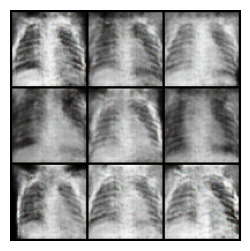

Epoch: 21/100 Batches: 0/41	Loss_D: 0.4804   Loss_G: 4.9852    D(x): 0.8237    D(G(z)): 0.1964 / 0.0366
Epoch: 22/100 Batches: 0/41	Loss_D: 0.6222   Loss_G: 6.4758    D(x): 0.9047    D(G(z)): 0.3392 / 0.0113
Epoch: 23/100 Batches: 0/41	Loss_D: 0.3871   Loss_G: 4.5977    D(x): 0.8427    D(G(z)): 0.1504 / 0.0237
Epoch: 24/100 Batches: 0/41	Loss_D: 0.5972   Loss_G: 2.3590    D(x): 0.6530    D(G(z)): 0.0494 / 0.1515
Epoch: 25/100 Batches: 0/41	Loss_D: 0.3761   Loss_G: 5.7796    D(x): 0.9359    D(G(z)): 0.2295 / 0.0097
Epoch: 26/100 Batches: 0/41	Loss_D: 0.8485   Loss_G: 9.2337    D(x): 0.9603    D(G(z)): 0.5004 / 0.0009
Epoch: 27/100 Batches: 0/41	Loss_D: 0.5286   Loss_G: 7.2651    D(x): 0.9009    D(G(z)): 0.2927 / 0.0029
Epoch: 28/100 Batches: 0/41	Loss_D: 1.0127   Loss_G: 5.8978    D(x): 0.4810    D(G(z)): 0.0081 / 0.0269
Epoch: 29/100 Batches: 0/41	Loss_D: 0.3588   Loss_G: 4.8103    D(x): 0.7695    D(G(z)): 0.0348 / 0.0205
Epoch: 30/100 Batches: 0/41	Loss_D: 0.4935   Loss_G: 3.7121    D

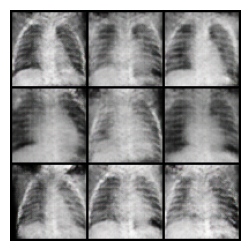

Epoch: 31/100 Batches: 0/41	Loss_D: 0.3723   Loss_G: 7.8815    D(x): 0.9102    D(G(z)): 0.1980 / 0.0016
Epoch: 32/100 Batches: 0/41	Loss_D: 0.4455   Loss_G: 7.2354    D(x): 0.9143    D(G(z)): 0.2610 / 0.0026
Epoch: 33/100 Batches: 0/41	Loss_D: 0.4950   Loss_G: 5.7993    D(x): 0.8638    D(G(z)): 0.2515 / 0.0146
Epoch: 34/100 Batches: 0/41	Loss_D: 0.3703   Loss_G: 5.9850    D(x): 0.9680    D(G(z)): 0.2568 / 0.0040
Epoch: 35/100 Batches: 0/41	Loss_D: 0.3604   Loss_G: 4.7984    D(x): 0.7650    D(G(z)): 0.0211 / 0.0251
Epoch: 36/100 Batches: 0/41	Loss_D: 0.3342   Loss_G: 3.5419    D(x): 0.7955    D(G(z)): 0.0361 / 0.0443
Epoch: 37/100 Batches: 0/41	Loss_D: 0.4370   Loss_G: 8.4410    D(x): 0.9621    D(G(z)): 0.2948 / 0.0006
Epoch: 38/100 Batches: 0/41	Loss_D: 0.5716   Loss_G: 8.4374    D(x): 0.9369    D(G(z)): 0.3563 / 0.0016
Epoch: 39/100 Batches: 0/41	Loss_D: 0.5009   Loss_G: 5.0394    D(x): 0.7556    D(G(z)): 0.0688 / 0.0261
Epoch: 40/100 Batches: 0/41	Loss_D: 0.9008   Loss_G: 10.2842    

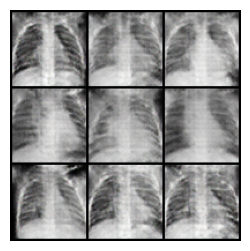

Epoch: 41/100 Batches: 0/41	Loss_D: 0.3612   Loss_G: 4.8958    D(x): 0.8714    D(G(z)): 0.1649 / 0.0161
Epoch: 42/100 Batches: 0/41	Loss_D: 0.9022   Loss_G: 9.4897    D(x): 0.9477    D(G(z)): 0.4736 / 0.0015
Epoch: 43/100 Batches: 0/41	Loss_D: 0.4238   Loss_G: 7.5241    D(x): 0.9358    D(G(z)): 0.2733 / 0.0038
Epoch: 44/100 Batches: 0/41	Loss_D: 0.3078   Loss_G: 3.6827    D(x): 0.8144    D(G(z)): 0.0554 / 0.0499
Epoch: 45/100 Batches: 0/41	Loss_D: 0.8525   Loss_G: 3.3433    D(x): 0.5673    D(G(z)): 0.0250 / 0.1141
Epoch: 46/100 Batches: 0/41	Loss_D: 0.2602   Loss_G: 5.0318    D(x): 0.9174    D(G(z)): 0.1378 / 0.0157
Epoch: 47/100 Batches: 0/41	Loss_D: 0.6738   Loss_G: 5.6179    D(x): 0.6142    D(G(z)): 0.0045 / 0.0214
Epoch: 48/100 Batches: 0/41	Loss_D: 0.6038   Loss_G: 8.0198    D(x): 0.9345    D(G(z)): 0.3570 / 0.0020
Epoch: 49/100 Batches: 0/41	Loss_D: 0.1763   Loss_G: 3.8473    D(x): 0.9305    D(G(z)): 0.0901 / 0.0400
Epoch: 50/100 Batches: 0/41	Loss_D: 0.7195   Loss_G: 9.2358    D

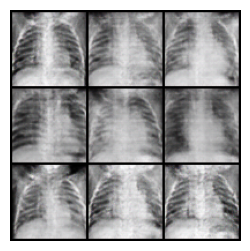

Epoch: 51/100 Batches: 0/41	Loss_D: 0.5445   Loss_G: 9.1247    D(x): 0.9759    D(G(z)): 0.3498 / 0.0006
Epoch: 52/100 Batches: 0/41	Loss_D: 0.1573   Loss_G: 5.0348    D(x): 0.9131    D(G(z)): 0.0491 / 0.0144
Epoch: 53/100 Batches: 0/41	Loss_D: 0.3477   Loss_G: 3.4077    D(x): 0.7721    D(G(z)): 0.0376 / 0.0963
Epoch: 54/100 Batches: 0/41	Loss_D: 0.2288   Loss_G: 5.1131    D(x): 0.9834    D(G(z)): 0.1695 / 0.0200
Epoch: 55/100 Batches: 0/41	Loss_D: 0.3416   Loss_G: 3.8026    D(x): 0.8111    D(G(z)): 0.0642 / 0.0457
Epoch: 56/100 Batches: 0/41	Loss_D: 0.2704   Loss_G: 4.1919    D(x): 0.8339    D(G(z)): 0.0478 / 0.0302
Epoch: 57/100 Batches: 0/41	Loss_D: 0.1978   Loss_G: 5.2274    D(x): 0.9327    D(G(z)): 0.1046 / 0.0117
Epoch: 58/100 Batches: 0/41	Loss_D: 0.2569   Loss_G: 4.1626    D(x): 0.8894    D(G(z)): 0.0955 / 0.0260
Epoch: 59/100 Batches: 0/41	Loss_D: 0.6322   Loss_G: 4.5040    D(x): 0.6793    D(G(z)): 0.0298 / 0.0586
Epoch: 60/100 Batches: 0/41	Loss_D: 0.3238   Loss_G: 6.1864    D

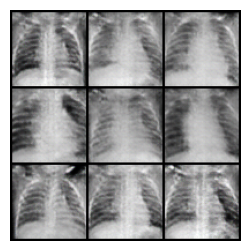

Epoch: 61/100 Batches: 0/41	Loss_D: 0.1893   Loss_G: 4.6082    D(x): 0.9659    D(G(z)): 0.1296 / 0.0169
Epoch: 62/100 Batches: 0/41	Loss_D: 0.3223   Loss_G: 3.9225    D(x): 0.8018    D(G(z)): 0.0268 / 0.0386
Epoch: 63/100 Batches: 0/41	Loss_D: 0.4898   Loss_G: 4.6077    D(x): 0.7793    D(G(z)): 0.1070 / 0.0333
Epoch: 64/100 Batches: 0/41	Loss_D: 0.5247   Loss_G: 8.6471    D(x): 0.9828    D(G(z)): 0.3367 / 0.0006
Epoch: 65/100 Batches: 0/41	Loss_D: 0.5674   Loss_G: 3.0294    D(x): 0.6670    D(G(z)): 0.0192 / 0.0917
Epoch: 66/100 Batches: 0/41	Loss_D: 0.1109   Loss_G: 5.2579    D(x): 0.9402    D(G(z)): 0.0420 / 0.0111
Epoch: 67/100 Batches: 0/41	Loss_D: 0.3597   Loss_G: 4.1041    D(x): 0.8289    D(G(z)): 0.0904 / 0.0353
Epoch: 68/100 Batches: 0/41	Loss_D: 0.3779   Loss_G: 6.6307    D(x): 0.9670    D(G(z)): 0.2611 / 0.0045
Epoch: 69/100 Batches: 0/41	Loss_D: 0.2519   Loss_G: 4.6626    D(x): 0.9475    D(G(z)): 0.1457 / 0.0208
Epoch: 70/100 Batches: 0/41	Loss_D: 0.7155   Loss_G: 8.1055    D

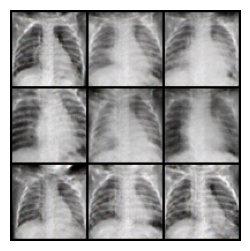

Epoch: 71/100 Batches: 0/41	Loss_D: 0.3057   Loss_G: 7.3229    D(x): 0.9739    D(G(z)): 0.2224 / 0.0039
Epoch: 72/100 Batches: 0/41	Loss_D: 0.2175   Loss_G: 3.0961    D(x): 0.8964    D(G(z)): 0.0785 / 0.0646
Epoch: 73/100 Batches: 0/41	Loss_D: 0.1757   Loss_G: 4.4642    D(x): 0.8944    D(G(z)): 0.0442 / 0.0219
Epoch: 74/100 Batches: 0/41	Loss_D: 0.2879   Loss_G: 7.0595    D(x): 0.9705    D(G(z)): 0.2094 / 0.0015
Epoch: 75/100 Batches: 0/41	Loss_D: 0.1941   Loss_G: 4.6531    D(x): 0.9225    D(G(z)): 0.0963 / 0.0156
Epoch: 76/100 Batches: 0/41	Loss_D: 0.0901   Loss_G: 5.0488    D(x): 0.9609    D(G(z)): 0.0412 / 0.0393
Epoch: 77/100 Batches: 0/41	Loss_D: 0.2513   Loss_G: 6.4773    D(x): 0.9900    D(G(z)): 0.1872 / 0.0064
Epoch: 78/100 Batches: 0/41	Loss_D: 0.1867   Loss_G: 5.1808    D(x): 0.8977    D(G(z)): 0.0593 / 0.0088
Epoch: 79/100 Batches: 0/41	Loss_D: 0.2551   Loss_G: 3.8574    D(x): 0.8744    D(G(z)): 0.0873 / 0.0327
Epoch: 80/100 Batches: 0/41	Loss_D: 0.1611   Loss_G: 4.9111    D

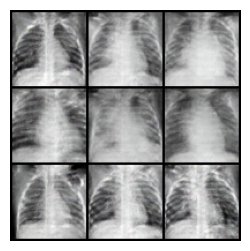

Epoch: 81/100 Batches: 0/41	Loss_D: 0.3120   Loss_G: 3.5961    D(x): 0.7946    D(G(z)): 0.0252 / 0.0686
Epoch: 82/100 Batches: 0/41	Loss_D: 0.2934   Loss_G: 3.2050    D(x): 0.8448    D(G(z)): 0.0759 / 0.0756
Epoch: 83/100 Batches: 0/41	Loss_D: 0.1811   Loss_G: 6.7747    D(x): 0.9881    D(G(z)): 0.1278 / 0.0039
Epoch: 84/100 Batches: 0/41	Loss_D: 0.3295   Loss_G: 6.1604    D(x): 0.9066    D(G(z)): 0.1780 / 0.0048
Epoch: 85/100 Batches: 0/41	Loss_D: 0.1892   Loss_G: 4.7336    D(x): 0.9321    D(G(z)): 0.1005 / 0.0137
Epoch: 86/100 Batches: 0/41	Loss_D: 0.2133   Loss_G: 4.8942    D(x): 0.9658    D(G(z)): 0.1462 / 0.0108
Epoch: 87/100 Batches: 0/41	Loss_D: 0.1428   Loss_G: 4.9418    D(x): 0.9164    D(G(z)): 0.0417 / 0.0133
Epoch: 88/100 Batches: 0/41	Loss_D: 0.0908   Loss_G: 5.1108    D(x): 0.9599    D(G(z)): 0.0443 / 0.0150
Epoch: 89/100 Batches: 0/41	Loss_D: 0.2526   Loss_G: 4.2105    D(x): 0.8353    D(G(z)): 0.0174 / 0.0387
Epoch: 90/100 Batches: 0/41	Loss_D: 0.1421   Loss_G: 6.2948    D

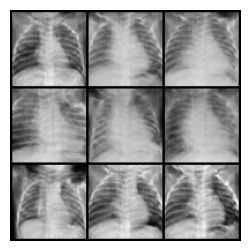

Epoch: 91/100 Batches: 0/41	Loss_D: 0.0877   Loss_G: 4.0303    D(x): 0.9421    D(G(z)): 0.0221 / 0.0272
Epoch: 92/100 Batches: 0/41	Loss_D: 0.8601   Loss_G: 12.0379    D(x): 0.9916    D(G(z)): 0.4066 / 0.0026
Epoch: 93/100 Batches: 0/41	Loss_D: 0.1288   Loss_G: 5.1381    D(x): 0.9594    D(G(z)): 0.0768 / 0.0096
Epoch: 94/100 Batches: 0/41	Loss_D: 0.2618   Loss_G: 6.5630    D(x): 0.9281    D(G(z)): 0.1400 / 0.0064
Epoch: 95/100 Batches: 0/41	Loss_D: 0.1283   Loss_G: 5.5483    D(x): 0.9234    D(G(z)): 0.0373 / 0.0083
Epoch: 96/100 Batches: 0/41	Loss_D: 0.1388   Loss_G: 4.8562    D(x): 0.9324    D(G(z)): 0.0574 / 0.0167
Epoch: 97/100 Batches: 0/41	Loss_D: 0.2580   Loss_G: 4.6301    D(x): 0.9064    D(G(z)): 0.1129 / 0.0206
Epoch: 98/100 Batches: 0/41	Loss_D: 0.3799   Loss_G: 8.8145    D(x): 0.9363    D(G(z)): 0.2030 / 0.0039
Epoch: 99/100 Batches: 0/41	Loss_D: 0.5083   Loss_G: 3.1941    D(x): 0.7248    D(G(z)): 0.0314 / 0.1010


In [ ]:
# Load 9 images
nb_images = 9  # Jumlah gambar yang akan ditampilkan
nb_row = math.ceil(math.sqrt(nb_images))  # Menentukan jumlah baris untuk menampilkan gambar

# Training Loop
data_len = len(dataloader)  # Panjang dataset untuk iterasi

# Daftar untuk melacak progress
img_list = []  # Menyimpan gambar yang dihasilkan oleh Generator
G_losses = []  # Menyimpan nilai loss untuk Generator
D_losses = []  # Menyimpan nilai loss untuk Discriminator

# Untuk setiap epoch
for epoch in range(num_epochs):
    # Untuk setiap batch dalam dataloader (tergantung pada batch_size dan jumlah gambar)
    for i, data in enumerate(dataloader, 0):

        # (1) Update jaringan D: memaksimalkan log(D(x)) + log(1 - D(G(z)))

        ## Latih dengan batch asli
        disc_net.zero_grad()  # Zero grad untuk Discriminator
        real_cpu = data['image'].to(device)  # Ambil batch gambar asli
        b_size = real_cpu.size(0)  # Ukuran batch
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)  # Label untuk gambar asli (1)
        output = disc_net(real_cpu).view(-1)  # Prediksi Discriminator untuk gambar asli
        errD_real = criterion(output, label)  # Hitung loss Discriminator untuk gambar asli
        errD_real.backward()  # Backprop untuk Discriminator
        D_x = output.mean().item()  # Mean output untuk monitoring

        ## Latih dengan batch palsu
        noise = torch.randn(b_size, nz, 1, 1, device=device)  # Buat noise sebagai input Generator
        fake = gen_net(noise)  # Hasilkan gambar palsu dengan Generator
        label.fill_(fake_label)  # Ganti label menjadi 0 untuk gambar palsu
        output = disc_net(fake.detach()).view(-1)  # Prediksi Discriminator untuk gambar palsu
        errD_fake = criterion(output, label)  # Hitung loss Discriminator untuk gambar palsu
        errD_fake.backward()  # Backprop untuk Discriminator
        D_G_z1 = output.mean().item()  # Mean output untuk monitoring
        errD = errD_real + errD_fake  # Total loss Discriminator
        optimizerD.step()  # Update parameter Discriminator

        # (2) Update jaringan G: memaksimalkan log(D(G(z)))

        gen_net.zero_grad()  # Zero grad untuk Generator
        label.fill_(real_label)  # Label palsu diubah menjadi 1 untuk cost Generator
        output = disc_net(fake).view(-1)  # Prediksi Discriminator untuk gambar palsu
        errG = criterion(output, label)  # Hitung loss Generator
        errG.backward()  # Backprop untuk Generator
        D_G_z2 = output.mean().item()  # Mean output untuk monitoring
        optimizerG.step()  # Update parameter Generator

        # (3) Metrics & Evaluation

        # Tampilkan statistik training setiap 50 batch (jika dataset besar, frekuensi print bisa dikurangi)
        if i % 50 == 0:
            print(f"Epoch: {epoch}/{num_epochs} Batches: {i}/{data_len}\tLoss_D: {errD.item():.4f}   Loss_G: {errG.item():.4f}    D(x): {D_x:.4f}    D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")

        # Simpan Loss untuk plotting nanti
        G_losses.append(errG.item())  # Simpan loss Generator
        D_losses.append(errD.item())  # Simpan loss Discriminator

    # Hasilkan gambar palsu untuk melihat bagaimana kinerja Generator pada fixed_noise setiap epoch
    if show_images == True and epoch % 10 == 0:
        with torch.no_grad():
            fake = gen_net(fixed_noise).detach().cpu()  # Hasilkan gambar palsu dengan fixed_noise
            img_list.append(vutils.make_grid(fake[:nb_images], padding=2, normalize=True, nrow=nb_row))  # Gabungkan gambar palsu menjadi grid

            plt.figure(figsize=(3, 3))
            plt.axis("off")
            plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))  # Tampilkan gambar

            if save_images == True:
                plt.savefig(f'images/epoch_{epoch}_gen_images.png')  # Simpan gambar yang dihasilkan

            plt.show()  # Tampilkan gambar

    # Simpan model setiap 5 epoch
    if epoch % 5 == 0:
        if save_model:
            save_dcgan(gen_net, disc_net, path_checkpoint=f"models/chest_epoch_{epoch}_checkpoint.pkl")

# Simpan model akhir setelah training selesai
save_dcgan(gen_net, disc_net, path_checkpoint="models/chest_final_epoch_checkpoint.pkl")


## Mari lihat grafik dari losses

Kita dapat melihat bahwa loss Generator dimulai sangat tinggi, karena diinisialisasi dengan noise acak. Sebaliknya, loss Discriminator relatif rendah karena gambar-gambar yang digunakan adalah noise acak dan jelas palsu. Seiring Generator semakin membaik, loss-nya menurun karena semakin sulit bagi Discriminator untuk membedakan antara gambar nyata dan palsu (dan sebaliknya, loss Discriminator meningkat). Selama pelatihan, Generator dan Discriminator melanjutkan proses adversarial ini, dan kita melihat bahwa losses akhirnya stabil dan berfluktuasi saat salah satu model membaik.

Idealnya, kita ingin model mencapai keseimbangan di mana Generator menghasilkan gambar berkualitas tinggi yang menantang bagi Discriminator, menghasilkan loss Generator dan Discriminator yang rendah.

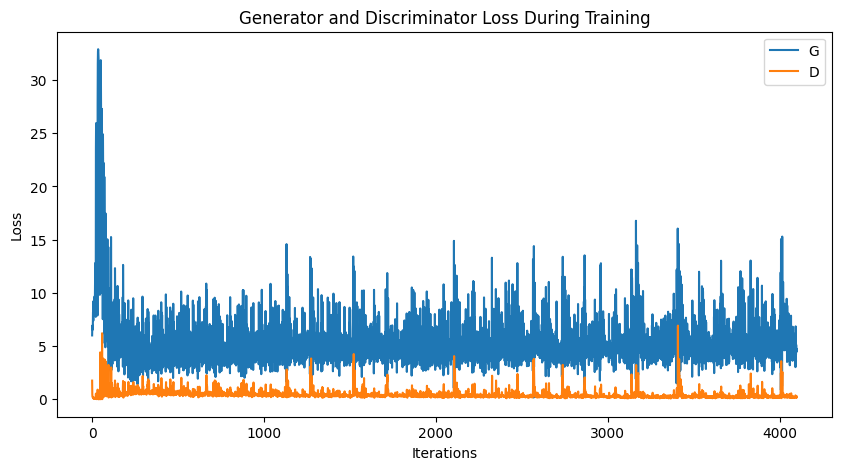

In [ ]:
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Kita akan membuat animasi untuk memvisualisasikan pelatihan.

In [ ]:
# Meningkatkan batas default yang ditetapkan oleh Matplotlib untuk menyematkan animasi
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 100  # 100 MB

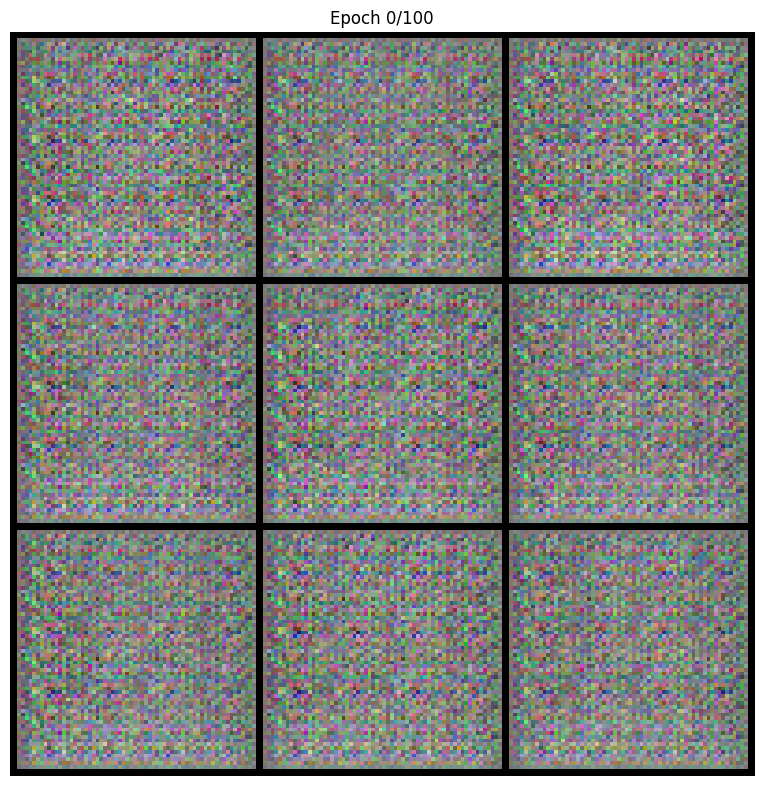

In [ ]:
# Membuat figure untuk animasi dengan ukuran (8x8)
fig = plt.figure(figsize=(8, 8))

# Menghilangkan sumbu pada plot
plt.axis("off")

# Mengatur tata letak plot untuk memberi ruang antar elemen gambar
plt.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)

# Judul kosong dan gambar pertama untuk animasi
title = plt.title("")
img_plot = plt.imshow(np.transpose(img_list[0], (1, 2, 0)), animated=True)

# Fungsi untuk memperbarui gambar dan judul setiap frame
def update_title_and_image(frame):
    # Memperbarui gambar pada frame yang sesuai
    img_plot.set_array(np.transpose(img_list[frame], (1, 2, 0)))
    # Memperbarui teks judul untuk menunjukkan epoch yang sedang ditampilkan
    title.set_text(f"Epoch {frame}/{num_epochs}")

# Membuat animasi dengan fungsi update, jumlah frame sebanyak jumlah gambar yang disimpan, dan interval waktu 100ms
ani = animation.FuncAnimation(fig, update_title_and_image, frames=len(img_list), interval=100, repeat_delay=5000)

# Menampilkan animasi dalam format HTML
HTML(ani.to_jshtml())

In [ ]:
# Menyimpan animasi sebagai file GIF di folder 'images'
ani.save('images/dcgan_training_animation.gif', writer='pillow')

### Mari gunakan model kita untuk membuat beberapa gambar paru-paru sintetis.

In [ ]:
# Menentukan path atau lokasi penyimpanan untuk model yang sudah dilatih
path_checkpoint = "models/chest_final_epoch_checkpoint.pkl"

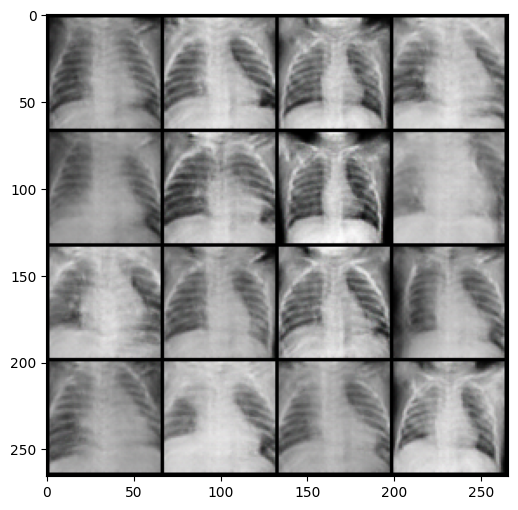

In [ ]:
# Jumlah gambar yang diinginkan
num_img = 16
# Menghitung jumlah baris dalam grid gambar
nb_row = math.ceil(math.sqrt(num_img))

# Membuat noise acak untuk input generator
random_noise = torch.randn(num_img, nz, 1, 1, device=device)

# Menginstansiasi generator baru
new_gen= Generator(nb_gpu).to(device)

# Menangani multi-GPU jika diperlukan
if (device.type == 'cuda') and (nb_gpu > 1):
    new_gen = nn.DataParallel(new_gen, list(range(nb_gpu)))

# Memuat bobot model dari path checkpoint yang telah disimpan
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_g = checkpoint["g_model_state_dict"]
new_gen.load_state_dict(state_dict_g)  # Memuat bobot generator ke model baru

# Menghasilkan gambar dari noise acak
with torch.no_grad():  # Menghentikan gradien untuk proses inferensi
    fake_data = new_gen(random_noise).detach().cpu()  # Mendapatkan hasil output generator

# Membuat grid gambar yang dihasilkan
img_grid = vutils.make_grid(fake_data, padding=2, normalize=True, nrow=nb_row).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))  # Mengubah urutan channel gambar untuk penampilan

# Menampilkan gambar
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)  # Menampilkan grid gambar
plt.show()  # Menampilkan plot


Berikutnya, kita akan membuat Discrminator baru dari model yang kita simpan.

In [ ]:
# Menginstansiasi discriminator baru
new_dis = Discriminator(nb_gpu).to(device)

# Menangani multi-GPU jika diperlukan
if (device.type == 'cuda') and (nb_gpu > 1):
    new_dis = nn.DataParallel(new_dis, list(range(nb_gpu)))  # Menangani distribusi model ke beberapa GPU

# Memuat bobot model dari path checkpoint yang telah disimpan
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_d = checkpoint["d_model_state_dict"]  # Mendapatkan state dictionary dari discriminator
new_dis.load_state_dict(state_dict_d)  # Memuat bobot discriminator ke model baru

<All keys matched successfully>

Kami akan menggunakan generator baru kami untuk membuat beberapa gambar paru-paru sintetis. Diskriminator baru akan memberi kami probabilitas bahwa gambar paru-paru sintetis itu nyata. Jika probabilitasnya lebih besar dari ambang batas (dalam kasus kami 70%), kami akan menambahkannya ke serangkaian gambar yang "baik".

Kami dapat melihat bahwa beberapa gambar yang "baik" itu buram. Ini menyoroti mengapa sangat penting untuk meminta ahli radiologi mengevaluasi gambar paru-paru sintetis!

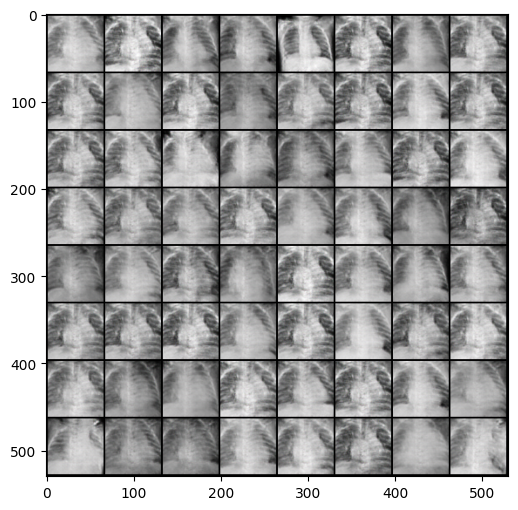

In [ ]:
# Menentukan threshold untuk klasifikasi gambar yang diterima oleh discriminator
threshold = 0.70

# Membuat list untuk menyimpan gambar-gambar yang memiliki probabilitas >= threshold
pass_threshold = []

# Loop untuk menghasilkan gambar sampai list pass_threshold memiliki 64 gambar
while len(pass_threshold) < 64:
    # Membuat noise acak untuk input generator
    random_noise = torch.randn(num_img, nz, 1, 1, device=device)

    # Menghasilkan gambar dengan noise yang telah dibuat
    with torch.no_grad():  # Tidak memerlukan gradient untuk operasi inferensi
        fake_data = new_gen(random_noise)

    # Menyetel discriminator ke mode evaluasi (tidak ada update parameter)
    new_dis.eval()

    # Melalui discriminator untuk mendapatkan probabilitas real/fake untuk gambar yang dihasilkan
    output_probabilities = new_dis(fake_data)

    # Membuat mask (Jika probabilitas < threshold, set ke False, jika >= threshold set True)
    good_image_mask = output_probabilities >= threshold

    # Menghapus dimensi tambahan dari tensor (torch.Size([16, 1, 1, 1]) menjadi torch.Size([16]))
    good_image_mask = good_image_mask.squeeze()

    # Menyaring gambar yang dipilih berdasarkan mask yang dihasilkan
    good_images = fake_data[good_image_mask > threshold]

    # Jika good_images tidak kosong
    if good_images.numel() > 0:
        # Loop melalui tensor pada dimensi pertama (dimensi gambar)
        for i in range(good_images.size(0)):
            # Menambahkan gambar yang disaring ke list pass_threshold
            pass_threshold.append(good_images[i])

# Menampilkan gambar-gambar yang telah disaring dan memenuhi threshold
img_grid = vutils.make_grid(pass_threshold, padding=2, normalize=True, nrow=8).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)
plt.show()


**Kutipan:**

Kermany, Daniel; Zhang, Kang; Goldbaum, Michael (2018), “Labeled Optical Coherence Tomography (OCT) and Chest X-Ray Images for Classification”, Mendeley Data, V2, doi: 10.17632/rscbjbr9sj.2